In [ ]:
pip install deap

In [ ]:
pip install pyswarm

In [ ]:
#Primero importamos algunas librerias
import random
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from matplotlib.colors import LogNorm
import matplotlib.animation as animation
from IPython.display import HTML
from deap import algorithms, base, creator, tools
from pyswarm import pso
from scipy.optimize import minimize

## Función de Rastrigin

Función de Rastrigin en 2D: $$
f(x_1, x_2) = 20 + \sum_{i=1}^{2} x_i^2 - 10cos\left( 2\pi{x_i} \right), \quad x_i \in [-5.12, 5.12], \quad i = 1, 2
$$
Función de Rastrigin en 3D
$$f(x_1, x_2,x_3) = 30 + \sum_{i=1}^{2} x_i^2 - 10cos\left( 2\pi{x_i} \right), \quad x_i \in [-5.12, 5.12], \quad i = 1, 2,3
$$





In [ ]:
def f_rastrigin2d(x1, x2):
  y = 20 + x1 ** 2 - 10 * np.cos(2 * np.pi * x1) + x2 ** 2 - 10 * np.cos(2 * np.pi * x2)
  return y

def f_rastrigin3d(x1,x2,x3):
  y = 30 + x1 ** 2 - 10 * np.cos(2 * np.pi * x1) + x2 ** 2 - 10 * np.cos(2 * np.pi * x2) + x3 ** 2 - 10 * np.cos(2 * np.pi * x3)
  return y

n = 50
x1 = np.linspace(-5.12, 5.12, n)
x2 = np.linspace(-5.12, 5.12, n)

X1, X2 = np.meshgrid(x1, x2)
X = np.vstack((X1.flatten(), X2.flatten())).T
z = f_rastrigin2d(X[:, 0], X[:, 1])
Z = z.reshape(n, n)

### Función de Rastrigin en 2D

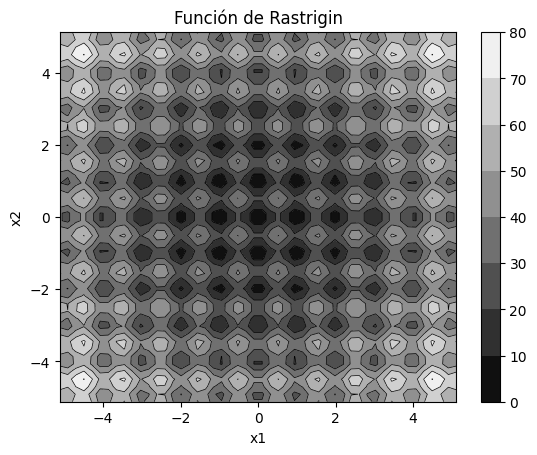

In [ ]:
# Crear un gráfico de contorno con valores numéricos
levels = np.arange(0, 90, 10)
cp = plt.contourf(x1, x2, Z, levels=levels, cmap='gray')
plt.colorbar(cp)

# Agregar líneas de contorno
plt.contour(x1, x2, Z, levels=levels, colors='k', linewidths=0.5)

# Título y etiquetas de los ejes
plt.title("Función de Rastrigin")
plt.xlabel("x1")
plt.ylabel("x2")

# Mostrar el gráfico
plt.show()


In [ ]:
# Cálculo de la función
z = f_rastrigin2d(X1, X2)

# Creación de la figura
fig = go.Figure(data=[go.Surface(x=X1, y=X2, z=z)])

# Personalización de la figura
fig.update_layout(
    title='Función de Rastrigin 2D',
    scene = dict(
        xaxis_title='X1',
        yaxis_title='X2',
        zaxis_title='Y',
        aspectmode='cube',
        camera=dict(
            eye=dict(x=1.75, y=-1.75, z=1.25)
        )
    )
)

# Mostrar la figura
fig.show()

##Descenso por gradiente

se usara el metodo de descenso de gradiente llamado gradiente conjugado no lineal (NCG), ya que es especialmente efectiva para minimizar funciones no lineales como la función de Rastrigin.

### En 2 dimensiónes

In [ ]:
def rastrigin(x):
    n = len(x)
    return 10*n + np.sum(x**2 - 10*np.cos(2*np.pi*x))

def gradient(x):
    n = len(x)
    grad = np.zeros(n)
    for i in range(n):
        grad[i] = 2*x[i] + 20*np.pi*np.sin(2*np.pi*x[i])
    return grad

def hessian(x):
    n = len(x)
    hess = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i == j:
                hess[i][i] = 2 + 40*np.pi**2*np.cos(2*np.pi*x[i])
            else:
                hess[i][j] = 0
    return hess

def optimize_rastrigin(initial_guess, max_iterations, tolerance=1e-6):
    x = initial_guess
    path = [x]
    for i in range(max_iterations):
        grad = gradient(x)
        hess = hessian(x)
        step = np.linalg.solve(hess, -grad)
        x_new = x + step
        if np.linalg.norm(x_new - x) < tolerance:
            break
        x = x_new
        path.append(x)
    return x, path

Init value: [-0.50494466 -3.37330719]
Minimum: [-0.50254604 -3.51785914]
Function value at minimum: 52.56371396825051
Optimization path: 
Punto evaluado:[-0.50494466 -3.37330719]-- Valor de la función en el punto: 48.62480460067024
Punto evaluado:[-0.50254556 -3.56167768]-- Valor de la función en el punto: 52.19526528500816
Punto evaluado:[-0.50254604 -3.51595359]-- Valor de la función en el punto: 52.5630050404597
Punto evaluado:[-0.50254604 -3.51785794]-- Valor de la función en el punto: 52.56371396796999
Punto evaluado:[-0.50254604 -3.51785914]-- Valor de la función en el punto: 52.56371396825051


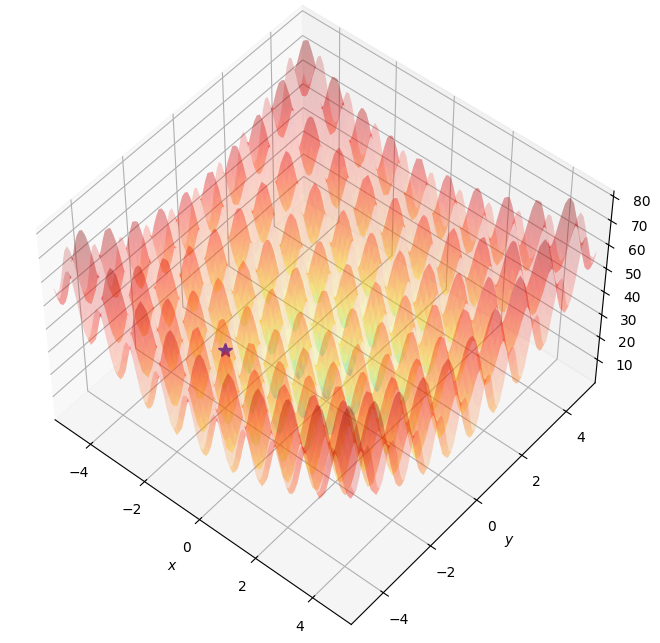

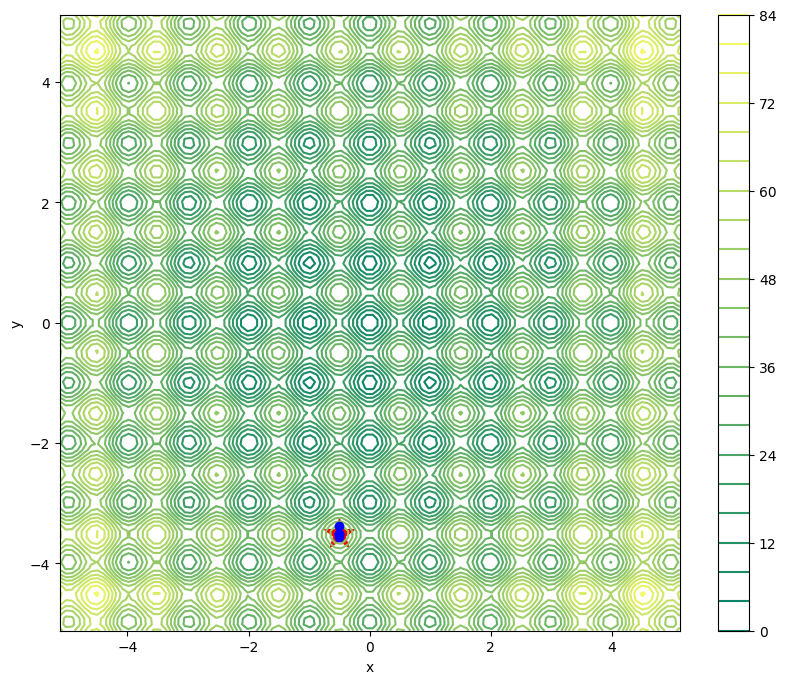

In [ ]:
rastrigin_init_point_2D = np.random.uniform(-5.12, 5.12, size=2) #Se genera un número aleatorio y se acota entre el dominio de la función
max_iterations = 1000
rastrigin_min_2D,rastrigin_path_2D = optimize_rastrigin(rastrigin_init_point_2D, 1000)

#Impresión de resultados
print(f"Init value: {rastrigin_init_point_2D}")
print(f"Minimum: {rastrigin_min_2D}")
print(f"Function value at minimum: {rastrigin(rastrigin_min_2D)}")
print("Optimization path: ")
for point in rastrigin_path_2D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {rastrigin(point)}")

    # Generate a grid of x, y values
rtg_x_min, rtg_x_max, rtg_x_maxvalues = -5.12, 5.12, 100
rtg_y_min, rtg_y_max, rtg_y_maxvalues = -5.12, 5.12, 100

x_rastrigin = np.linspace(rtg_x_min, rtg_x_max, rtg_x_maxvalues)
y_rastrigin = np.linspace(rtg_y_min, rtg_y_max, rtg_y_maxvalues)
X_rastrigin, Y_rastrigin = np.meshgrid(x_rastrigin, y_rastrigin)
# Compute the Rastrigin function for each (x, y) pair
Z_rastrigin = np.zeros_like(X_rastrigin)
for i in range(X_rastrigin.shape[0]):
    for j in range(X_rastrigin.shape[1]):
        Z_rastrigin[i, j] = rastrigin(np.array([X_rastrigin[i, j], Y_rastrigin[i, j]]))

rastrigin_minimum= rastrigin_min_2D.reshape(-1, 1)

#Test plot

rastrigin_surface_fig = plt.figure(figsize=(10,8))
rastrigin_surface_axes = plt.axes(projection='3d', elev=50, azim=-50)

rastrigin_surface_axes.plot_surface(X_rastrigin, Y_rastrigin, Z_rastrigin, norm=LogNorm(), rstride=1, cstride=1,
                edgecolor='none', alpha=.2, cmap=plt.cm.jet)
rastrigin_surface_axes.plot(*rastrigin_minimum, rastrigin(rastrigin_minimum), 'b*', markersize=10)

rastrigin_surface_axes.set_xlabel('$x$')
rastrigin_surface_axes.set_ylabel('$y$')
rastrigin_surface_axes.set_zlabel('$z$')

rastrigin_surface_axes.set_xlim((rtg_x_min, rtg_x_max))
rastrigin_surface_axes.set_ylim((rtg_y_min, rtg_y_max))

plt.show()

# Create a 2D contour plot of the Rastrigin function and plot the ptimization path
rastrigin_contour_fig, rastrigin_contour_axes = plt.subplots(figsize=(10,8))
contour = rastrigin_contour_axes.contour(X_rastrigin, Y_rastrigin, Z_rastrigin, levels=20, cmap='summer')
rastrigin_contour_axes.set_xlabel('x')
rastrigin_contour_axes.set_ylabel('y')

for point in rastrigin_path_2D:
  rastrigin_contour_axes.plot(*point, 'o-',color='blue',alpha=1)

# Add a marker for the global minimum at (0, 0)
rastrigin_contour_axes.scatter(*rastrigin_minimum, marker='*', s=500, color='red')
plt.colorbar(contour)
plt.show()

### Animación

<ipython-input-42-b8b00c132dcf>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later

<ipython-input-42-b8b00c132dcf>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later



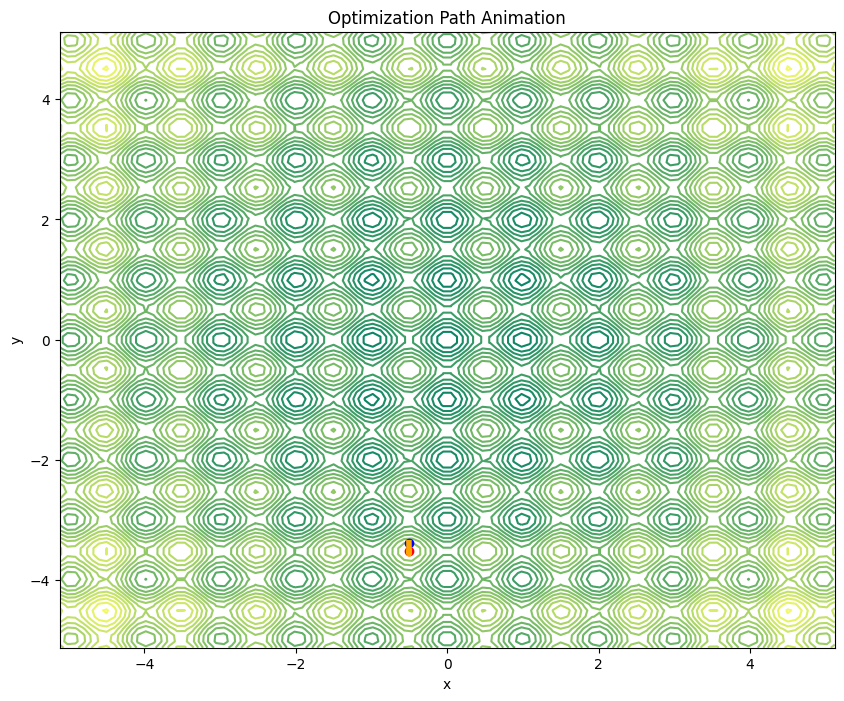

In [ ]:
# Define the function to update the animation
def update(frame):
    x = rastrigin_path_2D[frame]
    line.set_data(x[0], x[1])
    if frame > 0:
        line_trace.set_data([rastrigin_path_2D[i][0] for i in range(frame+1)], [rastrigin_path_2D[i][1] for i in range(frame+1)])
    return line, line_trace
# Set the starting point for the optimization
# x_start = np.array([-4, 4])

# Run the optimization
# x_opt, path = newton_raphson_optimization(x_start)

# Plot the contour and the starting point
rastrigin_contour_fig, rastrigin_contour_axes = plt.subplots(figsize=(10,8))
rastrigin_contour_axes.set_title('Optimization Path Animation')
rastrigin_contour_axes.set_xlabel('x')
rastrigin_contour_axes.set_ylabel('y')
rastrigin_contour = rastrigin_contour_axes.contour(X_rastrigin, Y_rastrigin, Z_rastrigin, levels=20, cmap='summer')
rastrigin_contour_axes.plot(rastrigin_init_point_2D[0], rastrigin_init_point_2D[1], 'o', color='blue')

# Set up the animation

line, = rastrigin_contour_axes.plot([], [], 'o-', color='red', lw=10)
line_trace, = rastrigin_contour_axes.plot([], [], '-', color='orange', lw=4)
ani = animation.FuncAnimation(rastrigin_contour_fig, update, frames=len(rastrigin_path_2D), interval=500, blit=True)

HTML(ani.to_jshtml())

### En 3 dimensiónes

In [ ]:
rastrigin_init_point_3D = np.random.uniform(-5.12, 5.12, size=3) #Se genera un número aleatorio y se acota entre el dominio de la función
rastrigin_min_3D,rastrigin_path_3D = optimize_rastrigin(rastrigin_init_point_3D, 1000)

#Impresión de resultados
print("Init value", rastrigin_init_point_3D)
print("Minimum:", rastrigin_min_3D)
print("Function value at minimum:", rastrigin(rastrigin_min_3D))
print("Optimization path: ")
for point in rastrigin_path_3D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {rastrigin(point)}")

Init value [-1.42409401 -2.22331953  2.23201828]
Minimum: [-1.50764073  2.51274266  1.50764072]
Function value at minimum: 70.80475894704043
Optimization path: 
Punto evaluado:[-1.42409401 -2.22331953  2.23201828]-- Valor de la función en el punto: 48.04121115276685
Punto evaluado:[-1.51497101 -1.24503321  0.79368422]-- Valor de la función en el punto: 41.40852235125393
Punto evaluado:[-1.50762733  3.31501314  1.33396603]-- Valor de la función en el punto: 64.03686140935667
Punto evaluado:[-1.50764073  3.73029008  1.62345364]-- Valor de la función en el punto: 67.18680838613066
Punto evaluado:[-1.50764073  2.55656311  1.47784839]-- Valor de la función en el punto: 70.25989289514865
Punto evaluado:[-1.50764073  2.51106091  1.50785764]-- Valor de la función en el punto: 70.80419546549793
Punto evaluado:[-1.50764073  2.51274266  1.50764072]-- Valor de la función en el punto: 70.80475894704043


## Algoritmos evolutivos

### En 2 dimensiónes

/usr/local/lib/python3.10/dist-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/usr/local/lib/python3.10/dist-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individuo' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.



Mejor solución encontrada: [-3.833221825742809e-07, 3.861929406111793e-08]
Valor de la función objetivo: 3.1441516057384433e-13


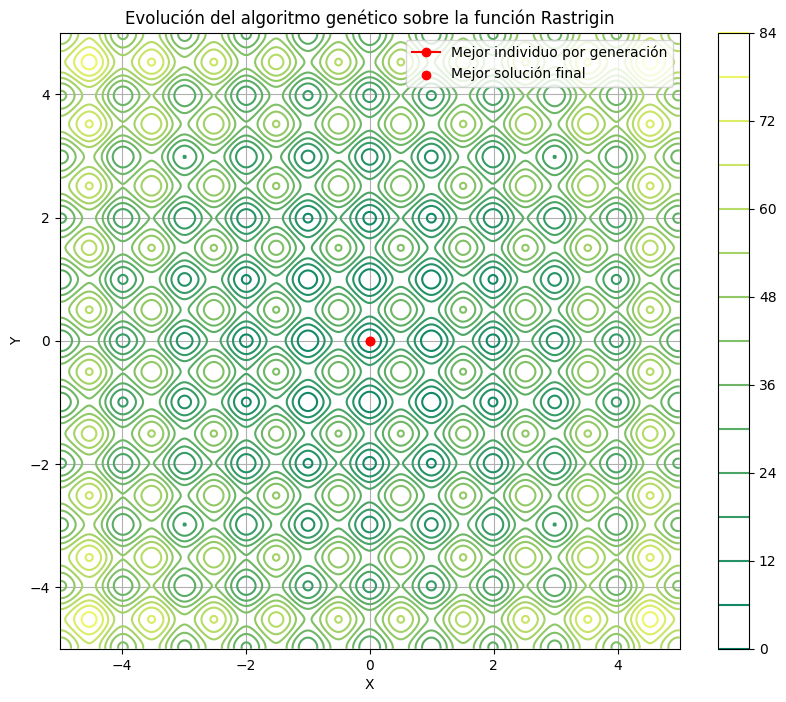

In [ ]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initCycle, creator.Individuo,
                 (toolbox.attr_float, toolbox.attr_float), n=1)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_rastrigin2d(individuo[0], individuo[1]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

mejores_individuos = []

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
mejores_individuos.append(mejor_individuo)
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])

# Graficar el paisaje de la función de Rastrigin y la trayectoria del algoritmo genético
x = np.linspace(limite_inferior, limite_superior, 400)
y = np.linspace(limite_inferior, limite_superior, 400)
X, Y = np.meshgrid(x, y)
Z = f_rastrigin2d(X, Y)

# Crear gráfico de contorno
plt.figure(figsize=(10, 8))
contour = plt.contour(X, Y, Z, levels=15, cmap='summer')
plt.colorbar(contour)
plt.title('Evolución del algoritmo genético sobre la función Rastrigin')
plt.xlabel('X')
plt.ylabel('Y')

# Extraer los puntos generados en cada generación y graficarlos
trayectoria_x = [ind[0] for ind in mejores_individuos]
trayectoria_y = [ind[1] for ind in mejores_individuos]
plt.plot(trayectoria_x, trayectoria_y, 'ro-', label='Mejor individuo por generación')

# Marcar la solución final
plt.scatter(mejor_individuo[0], mejor_individuo[1], color='red', label='Mejor solución final', zorder=5)

plt.legend()
plt.grid(True)
plt.show()

### En 3 dimensiónes

In [ ]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initRepeat, creator.Individuo,
                 toolbox.attr_float, n=3)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_rastrigin3d(individuo[0], individuo[1], individuo[2]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])

Mejor solución encontrada: [2.191996494401166e-05, 2.088024157968741e-05, -1.3018586613149118e-05]
Valor de la función objetivo: 2.1544447470489558e-07


## Optimización de particulas

### En 2 dimensiónes

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [ 7.86244124e-06 -3.50371249e-07]
Valor de la función objetivo en el punto óptimo: 1.228855062151979e-08


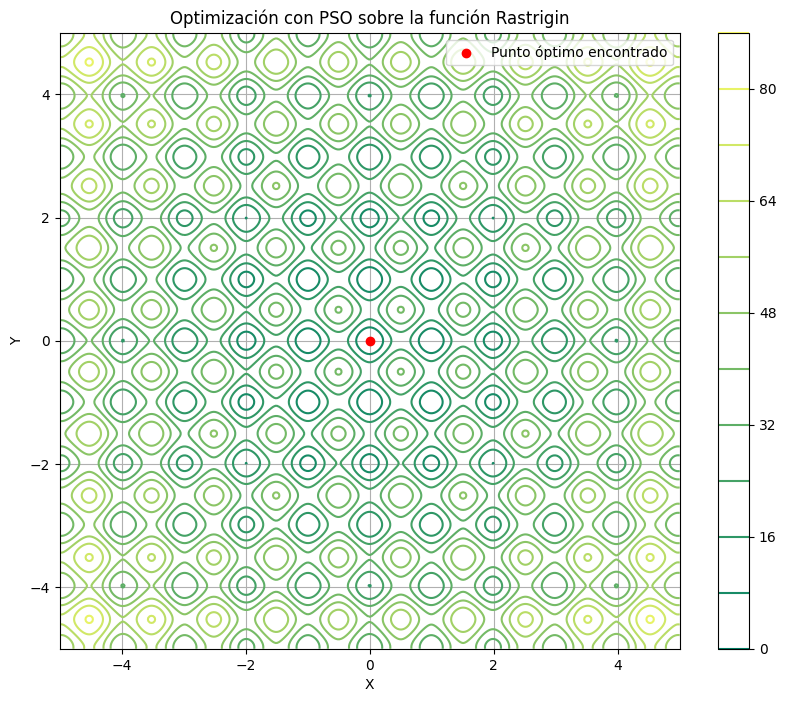

In [ ]:
lb = [-5, -5]  # límite inferior de las variables
ub = [5, 5]    # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_rastrigin2d(x[0], x[1]), lb, ub)

print("El punto óptimo es:", x_opt)
print("Valor de la función objetivo en el punto óptimo:", f_opt)

# Crear el paisaje de la función de Rastrigin para el gráfico de contorno
x = np.linspace(lb[0], ub[0], 400)
y = np.linspace(lb[1], ub[1], 400)
X, Y = np.meshgrid(x, y)
Z = f_rastrigin2d(X, Y)

# Crear el gráfico de contorno
plt.figure(figsize=(10, 8))
contour = plt.contour(X, Y, Z, levels=10, cmap='summer')
plt.colorbar(contour)
plt.title('Optimización con PSO sobre la función Rastrigin')
plt.xlabel('X')
plt.ylabel('Y')

# Graficar el punto óptimo encontrado por PSO
plt.scatter(x_opt[0], x_opt[1], color='red', label='Punto óptimo encontrado', zorder=5)

# Mostrar la leyenda y el gráfico
plt.legend()
plt.grid(True)
plt.show()

### En 3 dimensiónes

In [ ]:
lb = [-10, -10, -10]  # límite inferior de las variables
ub = [10, 10, 10]     # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_rastrigin3d(x[0], x[1], x[2]), lb, ub)

print("El punto óptimo es:", x_opt)

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [-4.89264215e-07 -9.85766819e-06 -9.94957864e-01]


## Optimización por evolución diferencial

### En 2 dimensiónes

Valor mínimo de la función:  0.9949590570932898
Variables que producen el valor mínimo:  (7.209675373562659e-10, 0.9949586376325563)


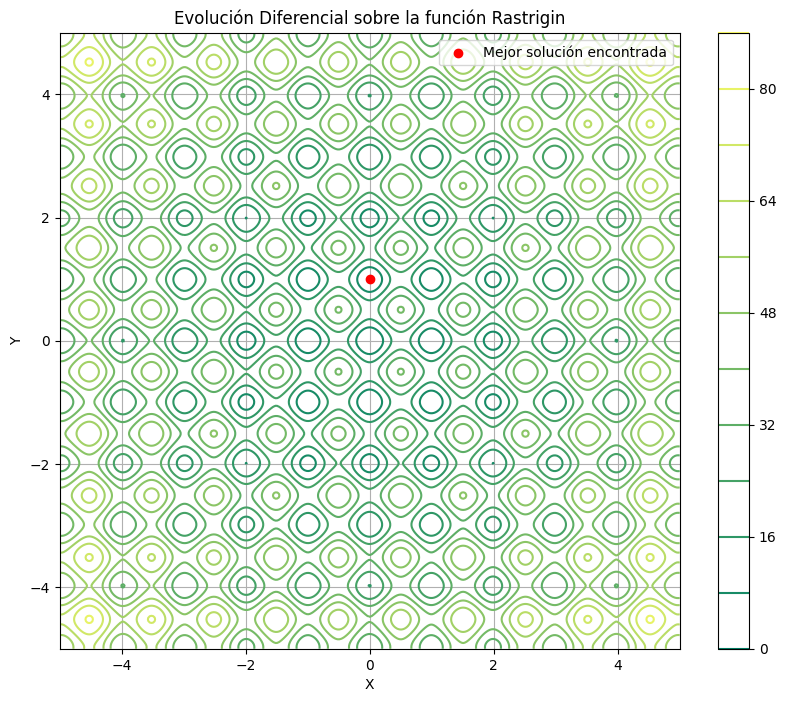

In [ ]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x e y
lim_inf = -5
lim_sup = 5

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    pop.append((x, y))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2 = random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
        else:
            x = a[0]
            y = a[1]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_rastrigin2d(x, y)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_rastrigin2d(pop[i][0], pop[i][1]):
            pop[i] = (x, y)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_rastrigin2d(x[0], x[1]))
print('Valor mínimo de la función: ', f_rastrigin2d(best_ind[0], best_ind[1]))
print('Variables que producen el valor mínimo: ', best_ind)

# Graficar el paisaje de la función Rastrigin en 2D
x = np.linspace(lim_inf, lim_sup, 400)
y = np.linspace(lim_inf, lim_sup, 400)
X, Y = np.meshgrid(x, y)
Z = f_rastrigin2d(X, Y)

# Crear gráfico de contorno
plt.figure(figsize=(10, 8))
contour = plt.contour(X, Y, Z, levels=10, cmap='summer')
plt.colorbar(contour)
plt.title('Evolución Diferencial sobre la función Rastrigin')
plt.xlabel('X')
plt.ylabel('Y')

# Graficar el mejor individuo encontrado
plt.scatter(best_ind[0], best_ind[1], color='red', label='Mejor solución encontrada', zorder=5)

# Mostrar la leyenda y el gráfico
plt.legend()
plt.grid(True)
plt.show()

### En 3 dimensiónes

In [ ]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x, y, y z
lim_inf = -10
lim_sup = 10

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    z = random.uniform(lim_inf, lim_sup)
    pop.append((x, y, z))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2, R3 = random.random(), random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)
        z_new = np.clip(a[2] + F*(b[2] - c[2]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
            z = z_new
        else:
            x = a[0]
            y = a[1]
            z = a[2]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_rastrigin3d(x, y, z)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_rastrigin3d(pop[i][0], pop[i][1], pop[i][2]):
            pop[i] = (x, y, z)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_rastrigin3d(x[0], x[1], x[2]))
print('Valor mínimo de la función: ', f_rastrigin3d(best_ind[0], best_ind[1], best_ind[2]))
print('Variables que producen el valor mínimo: ', best_ind)

Valor mínimo de la función:  2.2397817976108882
Variables que producen el valor mínimo:  (0.0033836522441003237, 0.02106047330045476, 0.9176998721691423)
